<a href="https://colab.research.google.com/github/jihansand/DeepLearning/blob/main/Skintype_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Implementasi Model YOLOv8 Dalam Klasifikasi Tipe Kulit Wajah Manusia
1.   Chatlea Shakira Haq (2106725116)
2.   Jihan Sandrina Halim (2106708160)
3.   Ricky (2106724952)

In [ ]:
from roboflow import Roboflow
from ultralytics import YOLO
import os
import random
import shutil
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Unduh dataset dari Roboflow
rf = Roboflow(api_key="wC4J74GuTyN1Xe2oNsjc")
project = rf.workspace("gunawan-c3pc7").project("jenis-kulit-wajah")
version = project.version(6)
dataset = version.download("yolov8")

# Path ke dataset yang diunduh
dataset_dir = dataset.location

loading Roboflow workspace...
loading Roboflow project...


In [ ]:
# Path ke dataset yang diunduh
dataset_dir = os.path.expanduser('~/Jenis-Kulit-Wajah-6')

# Path absolut ke subdirektori
train_path = os.path.join(dataset_dir, 'train/images')
val_path = os.path.join(dataset_dir, 'valid/images')
test_path = os.path.join(dataset_dir, 'test/images')

# Buat konten untuk file data.yaml
data_yaml_content = f"""
train: {train_path}
val: {val_path}
test: {test_path}

nc: 2  # Jumlah kelas
names: ['Jenis Kulit Berminyak', 'Jenis Kulit Normal']  # Nama kelas
"""

# Simpan konten ke file data.yaml
data_yaml_path = os.path.join(dataset_dir, 'data.yaml')
with open(data_yaml_path, 'w') as file:
    file.write(data_yaml_content)

# Periksa apakah file data.yaml ada di lokasi yang benar
print(f"File data.yaml ada: {os.path.exists(data_yaml_path)}")
print(f"Path absolut ke data.yaml: {os.path.abspath(data_yaml_path)}")

File data.yaml ada: True
Path absolut ke data.yaml: /Users/ricky/Jenis-Kulit-Wajah-6/data.yaml


In [ ]:
# Path ke file data.yaml yang sudah dibuat
data_yaml_path = os.path.expanduser(f'{dataset_dir}/data.yaml')

# Load model YOLOv8 pre-trained
model = YOLO('yolov8n.pt')  # Use 'yolov8n.pt' for the smallest model

# Melatih model dengan subset data
results = model.train(data=data_yaml_path, epochs=10, imgsz=320, batch=4)

# Simpan model yang sudah dilatih
model_path = os.path.join('runs', 'detect', 'train', 'weights', 'best.pt')
print(f"Model disimpan di: {model_path}")

100%|██████████| 6.23M/6.23M [00:01<00:00, 3.30MB/s]
New https://pypi.org/project/ultralytics/8.2.22 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.8.8 torch-2.2.2 CPU (Intel Core(TM) m3-7Y32 1.10GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/Users/ricky/Jenis-Kulit-Wajah-6/data.yaml, epochs=10, patience=50, batch=4, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stre

Model disimpan di: runs/detect/train/weights/best.pt



image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal82_jpg.rf.73c4cff1d20cf413b1741b9c838c990e.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 142.1ms
Speed: 5.0ms preprocess, 142.1ms inference, 5.2ms postprocess per image at shape (1, 3, 224, 320)


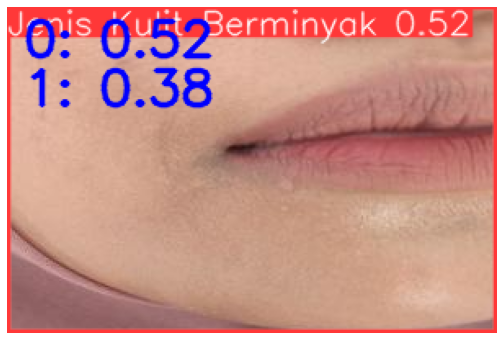


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak23_jpg.rf.ffdcfb3da9d803f3132521d862307452.jpg: 224x320 1 Jenis Kulit Berminyak, 103.0ms
Speed: 1.6ms preprocess, 103.0ms inference, 2.9ms postprocess per image at shape (1, 3, 224, 320)


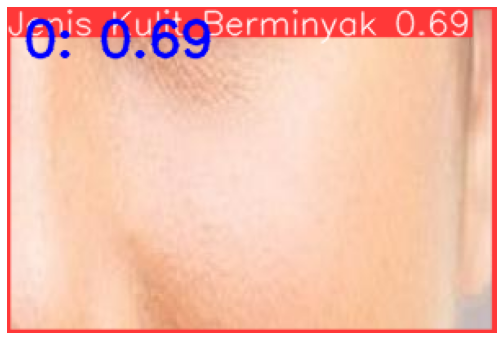


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak181_jpg.rf.d2266b1288e621ffebb9b405b331c832.jpg: 224x320 1 Jenis Kulit Berminyak, 98.6ms
Speed: 1.8ms preprocess, 98.6ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 320)


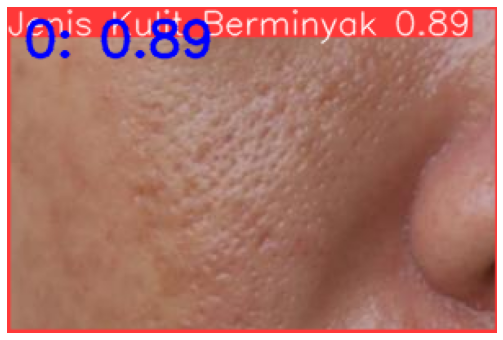


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak130_jpg.rf.36b17e132aad3cdf6c9d55b39ca082fa.jpg: 224x320 1 Jenis Kulit Berminyak, 131.1ms
Speed: 1.2ms preprocess, 131.1ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 320)


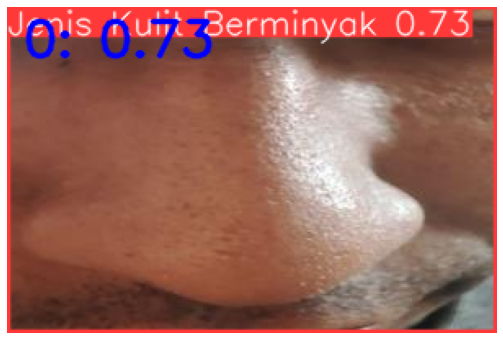


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak293_jpg.rf.e5614630c24a1eb1951ae58fcf3d2700.jpg: 224x320 1 Jenis Kulit Berminyak, 159.0ms
Speed: 1.0ms preprocess, 159.0ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 320)


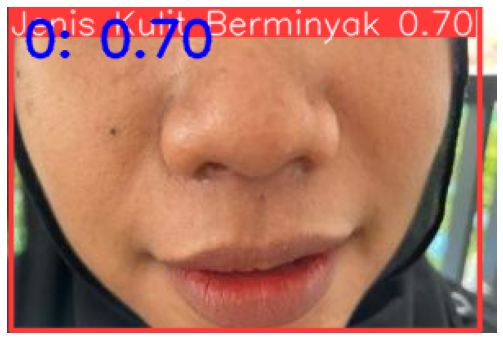


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal171_jpg.rf.5f89f0dc81889a6b245e71d30e46911a.jpg: 224x320 1 Jenis Kulit Normal, 100.7ms
Speed: 7.3ms preprocess, 100.7ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


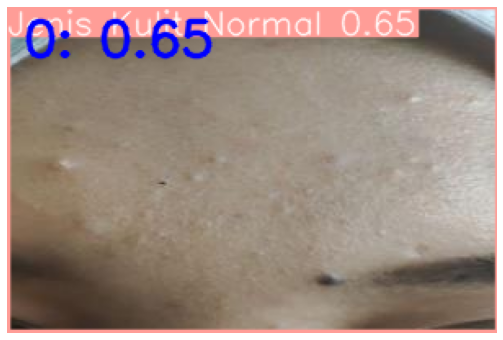


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Screenshot_2023-06-16-12-27-40-021_com-bd-nproject-edit_jpg.rf.b33c1d6c0a0b2a0d2b9831b6fbea5eb0.jpg: 224x320 1 Jenis Kulit Berminyak, 95.0ms
Speed: 3.4ms preprocess, 95.0ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


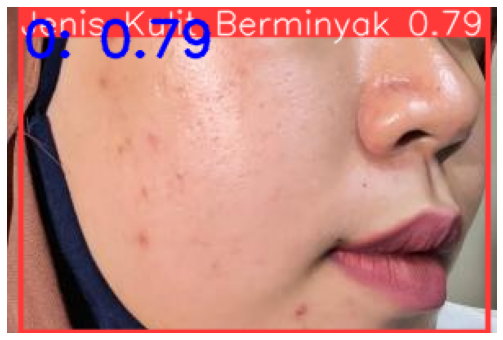


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak100_jpg.rf.5c1e2c54ca4f38ba9e386fa7468cc5e1.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 117.9ms
Speed: 7.8ms preprocess, 117.9ms inference, 7.7ms postprocess per image at shape (1, 3, 224, 320)


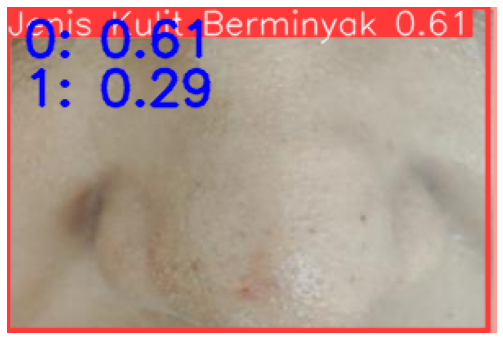


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/IMG_20230617_104705_jpg.rf.a684a2885e630f8b2e0b39e36f473951.jpg: 224x320 1 Jenis Kulit Normal, 100.7ms
Speed: 1.8ms preprocess, 100.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


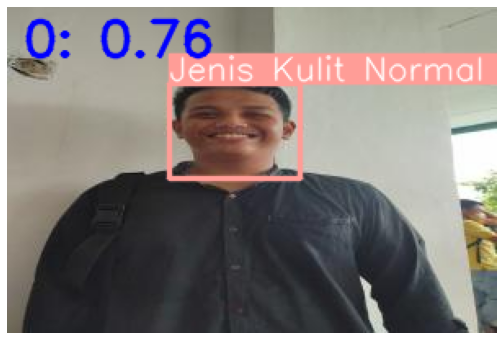


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak285_jpg.rf.2a7fa3cc1038ddc5883b2d891c7b807d.jpg: 224x320 1 Jenis Kulit Berminyak, 108.2ms
Speed: 1.6ms preprocess, 108.2ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


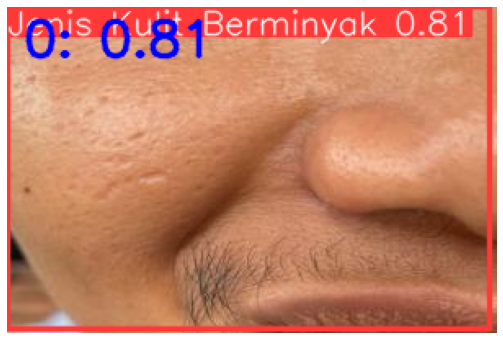


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak15_jpg.rf.fe8d46504676ad7c30e12b5d7649ae19.jpg: 224x320 1 Jenis Kulit Berminyak, 92.3ms
Speed: 2.0ms preprocess, 92.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


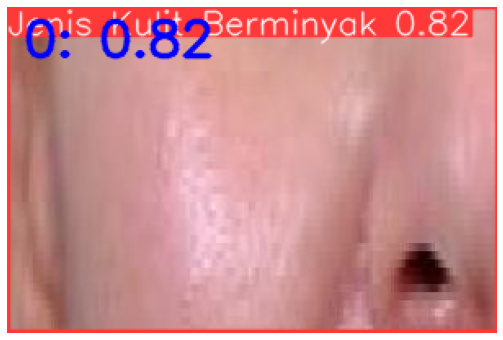


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal223_jpg.rf.9f9f8228d50940c00c19a84c7729dce5.jpg: 224x320 1 Jenis Kulit Normal, 102.3ms
Speed: 2.4ms preprocess, 102.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


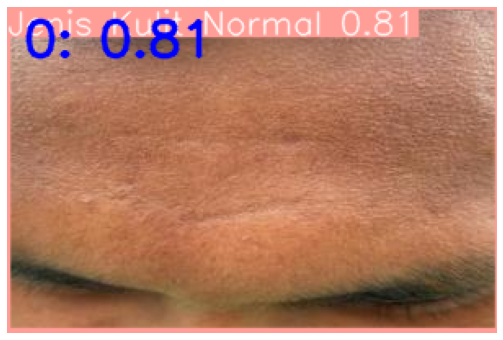


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Screenshot_2023-06-16-12-38-31-008_com-bd-nproject-edit_jpg.rf.5c852fe32b43a606290dbeb42596f997.jpg: 224x320 1 Jenis Kulit Berminyak, 112.0ms
Speed: 1.5ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


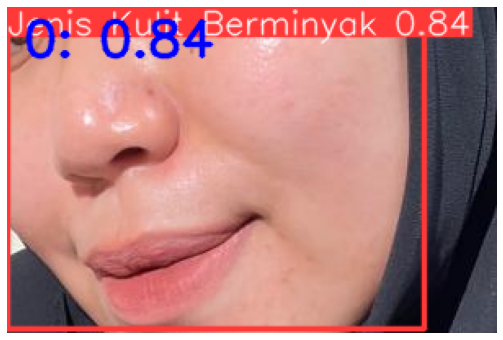


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/IMG_20230617_104603_jpg.rf.809ab260b579ebfe4875b45752eb646b.jpg: 224x320 1 Jenis Kulit Normal, 98.0ms
Speed: 1.3ms preprocess, 98.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


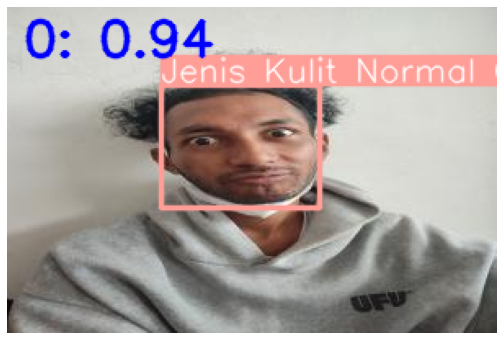


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal251_jpg.rf.54ba260a2477ae3c72e3c4a65063e3cf.jpg: 224x320 1 Jenis Kulit Normal, 153.8ms
Speed: 1.1ms preprocess, 153.8ms inference, 2.5ms postprocess per image at shape (1, 3, 224, 320)


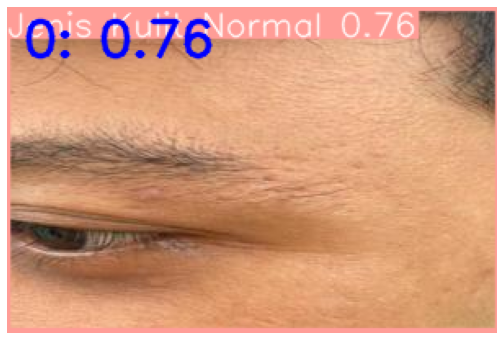


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak34_jpg.rf.a899da5d1a84364aab8cd343560b92df.jpg: 224x320 1 Jenis Kulit Berminyak, 115.6ms
Speed: 8.7ms preprocess, 115.6ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


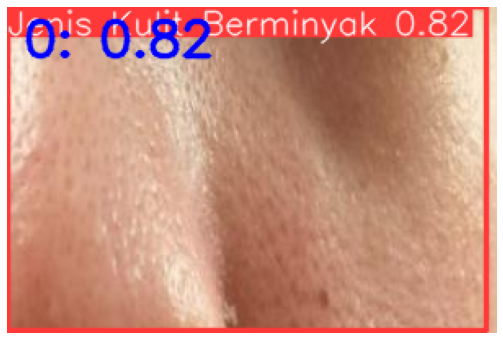


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak220_jpg.rf.83920dea2dc58b37ca73b43fc8983850.jpg: 224x320 1 Jenis Kulit Normal, 96.4ms
Speed: 1.2ms preprocess, 96.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


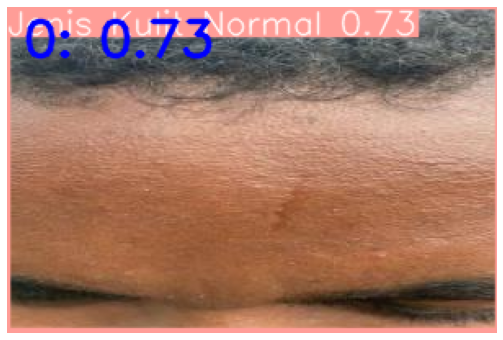


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak97_jpg.rf.9a1f4978da579c173d8b1693e7414a33.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 130.6ms
Speed: 1.8ms preprocess, 130.6ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


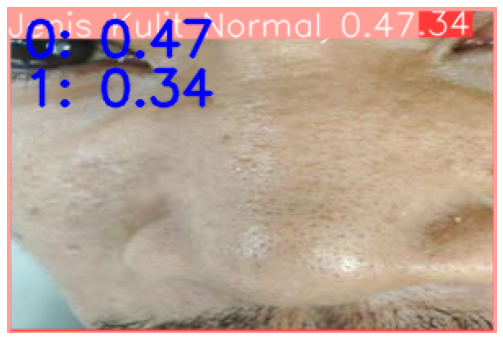


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak209_jpg.rf.2f58cc4611979b4d0b65b4c90e38c27b.jpg: 224x320 1 Jenis Kulit Normal, 112.6ms
Speed: 10.6ms preprocess, 112.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


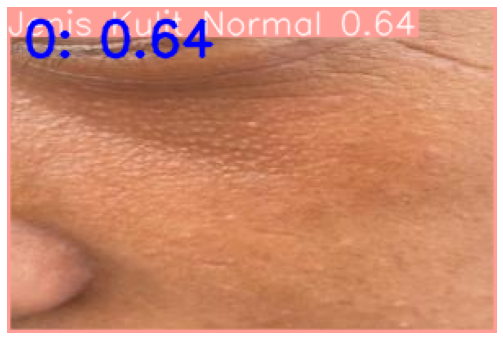


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal143_jpg.rf.3b99eb39cf06f47eb4ce123c34dedbb5.jpg: 224x320 1 Jenis Kulit Normal, 202.6ms
Speed: 2.4ms preprocess, 202.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


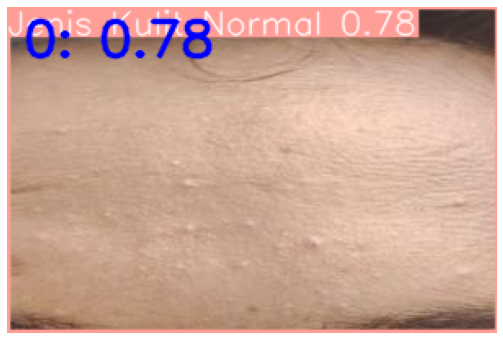


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal299_jpg.rf.c93b2124c6feeaa19c12c1c77f127275.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 109.7ms
Speed: 1.4ms preprocess, 109.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


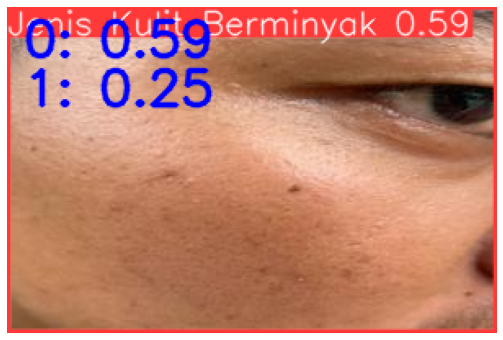


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal208_jpg.rf.8e6cc5722692423d6368fe2af1453a4c.jpg: 224x320 1 Jenis Kulit Normal, 105.8ms
Speed: 1.5ms preprocess, 105.8ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


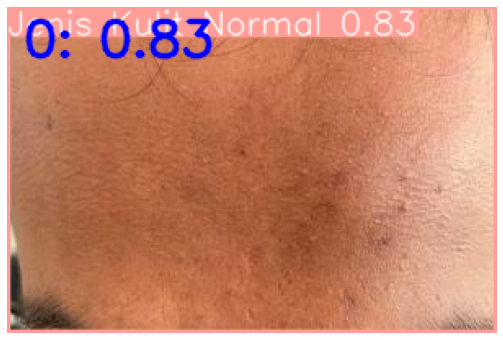


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak140_jpg.rf.e3fa680d9592f0e59485e8211d40022c.jpg: 224x320 1 Jenis Kulit Berminyak, 94.6ms
Speed: 7.6ms preprocess, 94.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


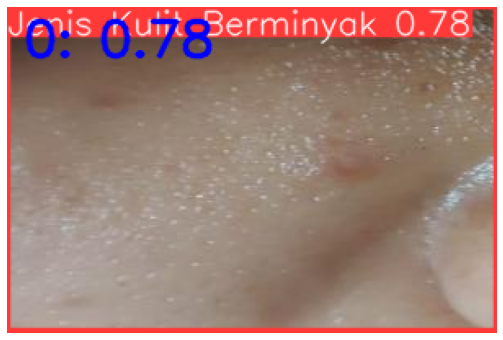


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak99_jpg.rf.414a41ddbb0d6a750504f28a3adec412.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 122.3ms
Speed: 3.3ms preprocess, 122.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


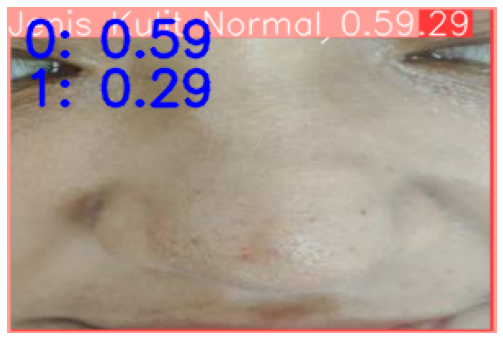


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak90_jpg.rf.4b3793511b8fcc18b63b2d8341ccf9a5.jpg: 224x320 1 Jenis Kulit Berminyak, 105.0ms
Speed: 11.5ms preprocess, 105.0ms inference, 2.9ms postprocess per image at shape (1, 3, 224, 320)


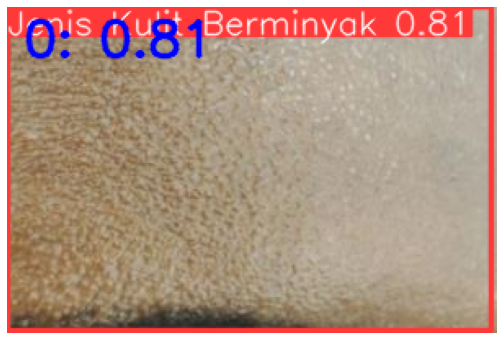


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal219_jpg.rf.5474f988e340ef8c45d8122cc57cabc7.jpg: 224x320 1 Jenis Kulit Normal, 107.9ms
Speed: 1.5ms preprocess, 107.9ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


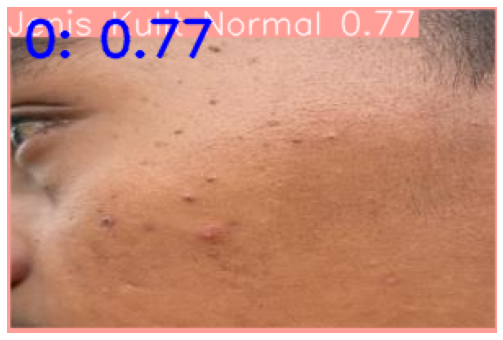


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal123_jpg.rf.eb022fd065f2bd84c7c76b49f58f54f7.jpg: 224x320 1 Jenis Kulit Normal, 114.7ms
Speed: 2.4ms preprocess, 114.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


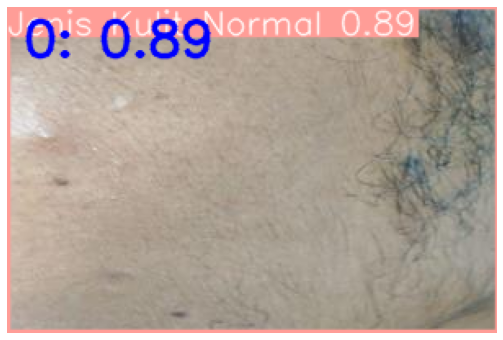


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak245_jpg.rf.f94a012c41e69c061d91f2c24edb19e4.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 126.3ms
Speed: 1.7ms preprocess, 126.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


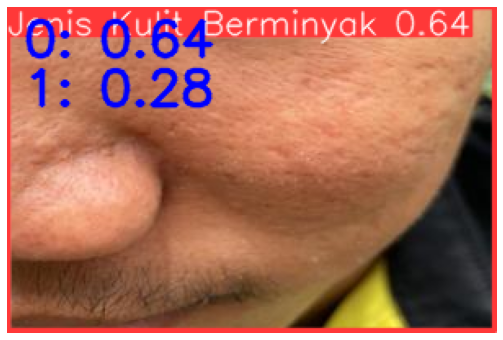


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal156_jpg.rf.35c2ab7aa756e487f9301e3c8e2cd4d5.jpg: 224x320 1 Jenis Kulit Normal, 126.4ms
Speed: 1.9ms preprocess, 126.4ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


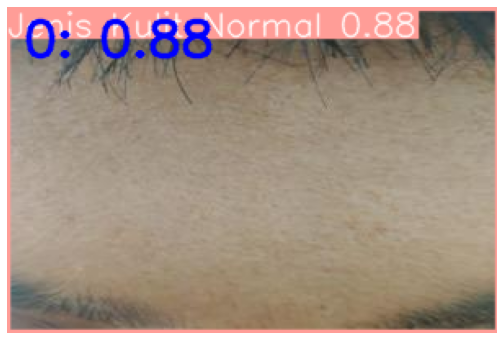


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal41_jpg.rf.569b274c4f806c4811bfe1505ffbac22.jpg: 224x320 1 Jenis Kulit Normal, 101.8ms
Speed: 1.6ms preprocess, 101.8ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


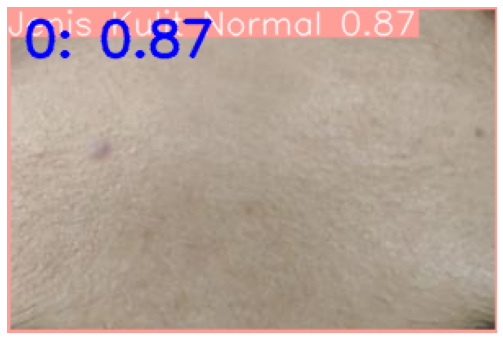


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal303_jpg.rf.77a80c1560da4460253e37059608ae09.jpg: 224x320 1 Jenis Kulit Berminyak, 95.7ms
Speed: 1.4ms preprocess, 95.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


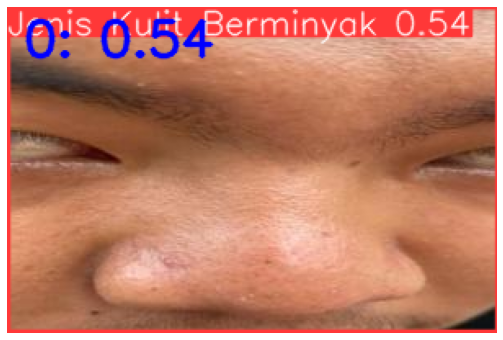


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak277_jpg.rf.0ae05027276426931628e86f13783e92.jpg: 224x320 1 Jenis Kulit Berminyak, 98.5ms
Speed: 8.6ms preprocess, 98.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


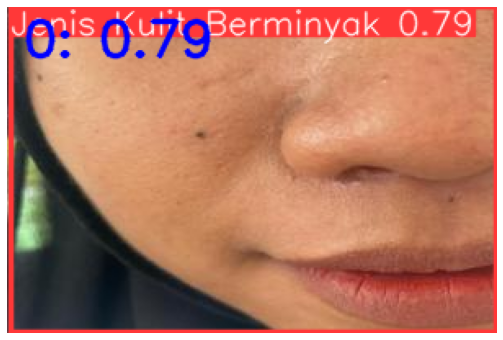


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak76_jpg.rf.6ad3820f757390598bdb69e872251c61.jpg: 224x320 1 Jenis Kulit Berminyak, 94.3ms
Speed: 3.4ms preprocess, 94.3ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


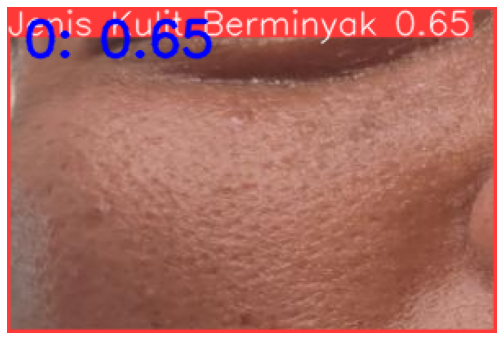


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal224_jpg.rf.1ae2b09ba02388a6ec4b3d8d4b52bb9f.jpg: 224x320 1 Jenis Kulit Normal, 118.8ms
Speed: 2.4ms preprocess, 118.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


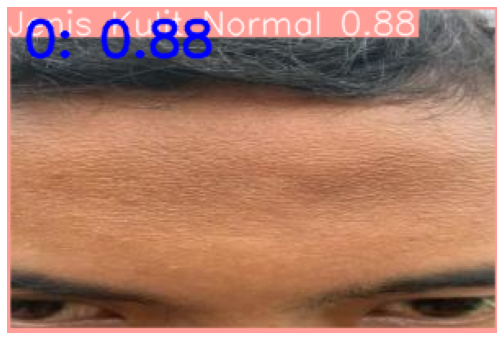


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak274_jpg.rf.fe8702aed557054ce1b68d64a62341ca.jpg: 224x320 1 Jenis Kulit Berminyak, 92.8ms
Speed: 1.2ms preprocess, 92.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


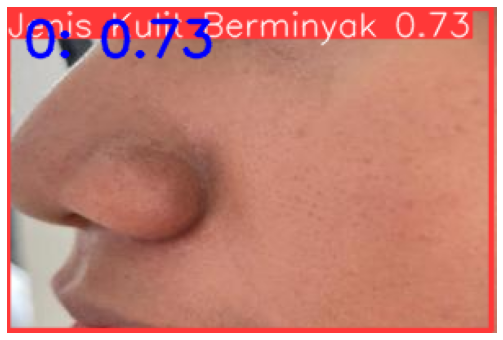


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak156_jpg.rf.6a2fd69d0531bf920941bdefbc6bd755.jpg: 224x320 1 Jenis Kulit Berminyak, 87.1ms
Speed: 1.4ms preprocess, 87.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


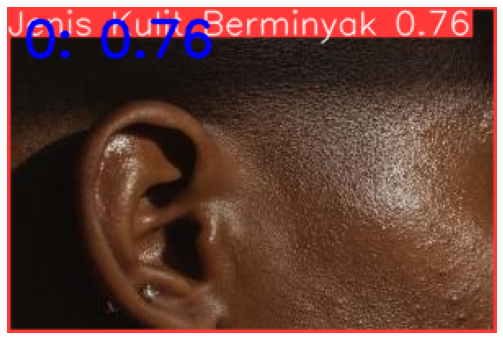


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak149_jpg.rf.d80c37e6dc9703523f6ddbe669ec6c21.jpg: 224x320 1 Jenis Kulit Normal, 97.7ms
Speed: 1.3ms preprocess, 97.7ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


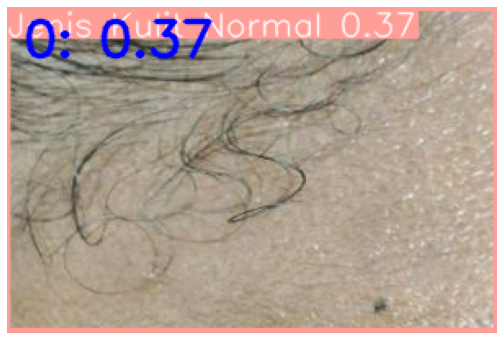


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak250_jpg.rf.d1ee643c092cdb07e034548cb6d6466b.jpg: 224x320 1 Jenis Kulit Berminyak, 90.1ms
Speed: 1.7ms preprocess, 90.1ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


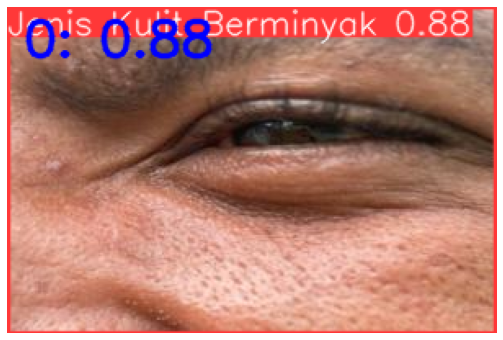


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal48_jpg.rf.e2754187d1deeab67af06cc48b127dbe.jpg: 224x320 1 Jenis Kulit Berminyak, 96.3ms
Speed: 2.5ms preprocess, 96.3ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 320)


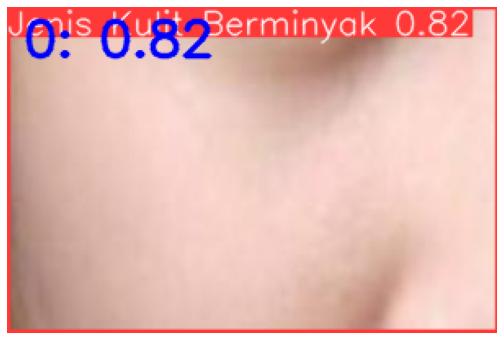


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal72_jpg.rf.30780cc35adb553aee64193327fc899d.jpg: 224x320 1 Jenis Kulit Normal, 92.2ms
Speed: 1.4ms preprocess, 92.2ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


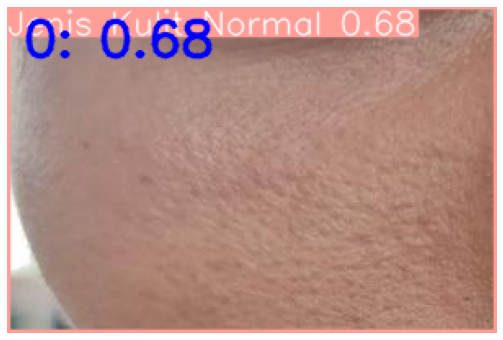


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Screenshot_2023-06-16-13-00-16-775_com-bd-nproject-edit_jpg.rf.c5d100a2c61fd46c1a409c3c69e5c436.jpg: 224x320 1 Jenis Kulit Normal, 76.9ms
Speed: 2.0ms preprocess, 76.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


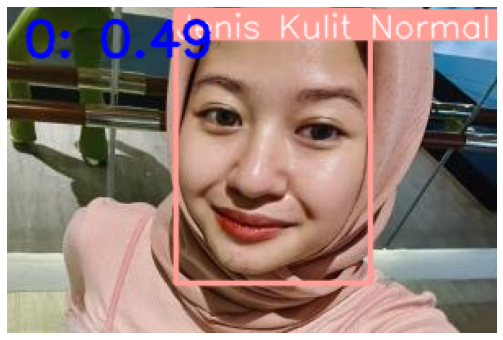


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal96_jpg.rf.98e13df0befb0e04969bcaf9ca8e3b3d.jpg: 224x320 1 Jenis Kulit Normal, 142.7ms
Speed: 1.6ms preprocess, 142.7ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 320)


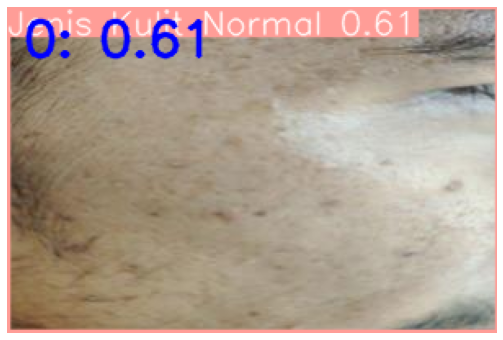


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak150_jpg.rf.0fc46eb2c719af530bb305a24960bd1e.jpg: 224x320 1 Jenis Kulit Berminyak, 122.9ms
Speed: 1.5ms preprocess, 122.9ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


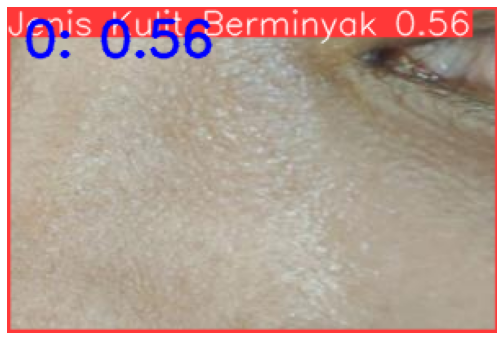


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak37_jpg.rf.7d77242bd09e3e2c8edf16c65a1013b3.jpg: 224x320 1 Jenis Kulit Berminyak, 85.8ms
Speed: 1.8ms preprocess, 85.8ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 320)


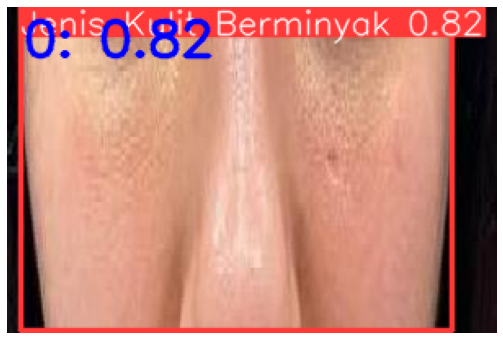


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak16_jpg.rf.7c1d79a5835009ae2c2c5d9de3c92053.jpg: 224x320 1 Jenis Kulit Berminyak, 100.1ms
Speed: 3.8ms preprocess, 100.1ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


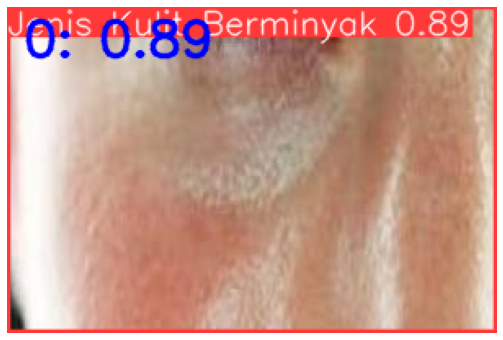


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal276_jpg.rf.a9c5c68bfb78f88ae107757d188eb0c7.jpg: 224x320 1 Jenis Kulit Normal, 119.2ms
Speed: 1.4ms preprocess, 119.2ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


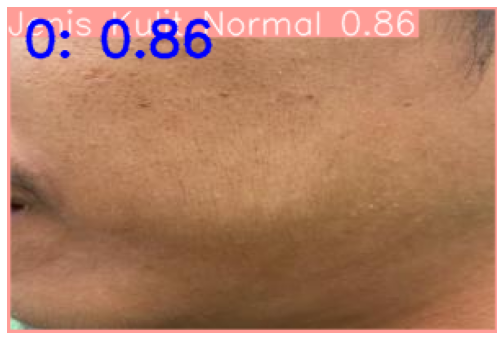


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak157_jpg.rf.e4e1968c8162dc629b9d3f22cfc207fe.jpg: 224x320 1 Jenis Kulit Berminyak, 84.4ms
Speed: 2.1ms preprocess, 84.4ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


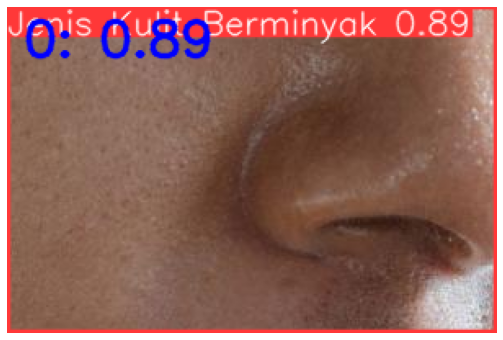


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak168_jpg.rf.587a326f03375fdf8f8a9fa036878df7.jpg: 224x320 1 Jenis Kulit Berminyak, 107.8ms
Speed: 1.4ms preprocess, 107.8ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


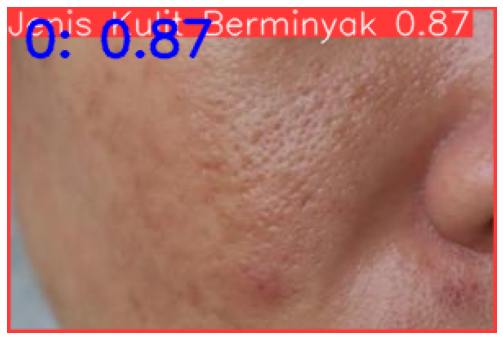


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal154_jpg.rf.515f519eb2a8902df88f7de647469942.jpg: 224x320 1 Jenis Kulit Normal, 88.8ms
Speed: 7.1ms preprocess, 88.8ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


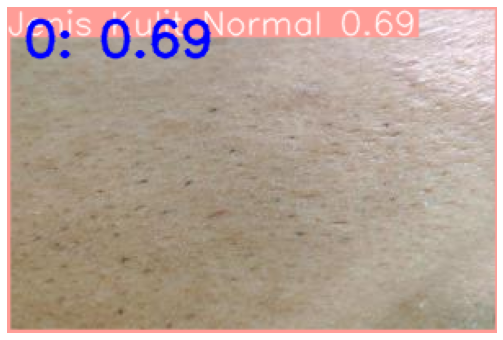


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak131_jpg.rf.d8f87bb16842ca18f991abd1b7594dba.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 93.7ms
Speed: 2.6ms preprocess, 93.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


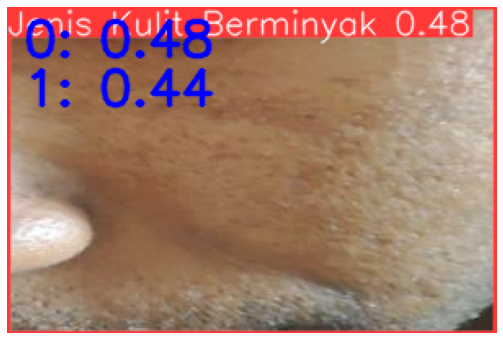


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak79_jpg.rf.2c85ac613ae95261c9c069e082b2b89a.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 106.1ms
Speed: 9.1ms preprocess, 106.1ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


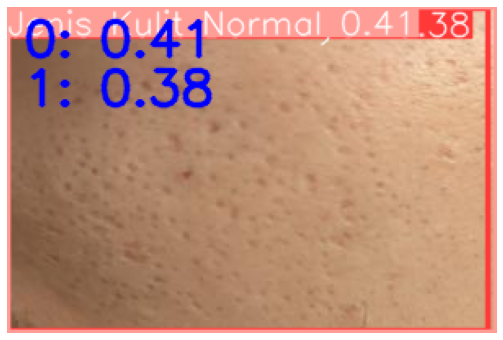


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak48_jpg.rf.19066cbf2be4d8724e58e161710bbb2a.jpg: 224x320 1 Jenis Kulit Berminyak, 105.5ms
Speed: 1.7ms preprocess, 105.5ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


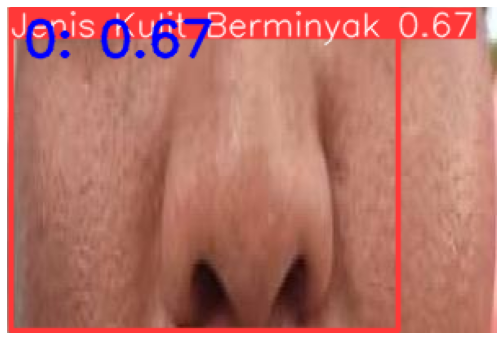


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal97_jpg.rf.5971ce8d623dcdce6e5edcc232b2c326.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 97.2ms
Speed: 2.0ms preprocess, 97.2ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 320)


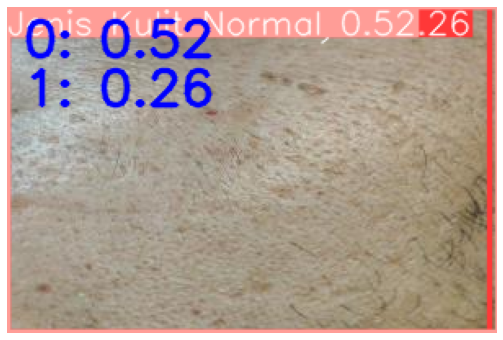


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal158_jpg.rf.162b33567e9126e3706880576040cebd.jpg: 224x320 1 Jenis Kulit Normal, 108.4ms
Speed: 1.7ms preprocess, 108.4ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


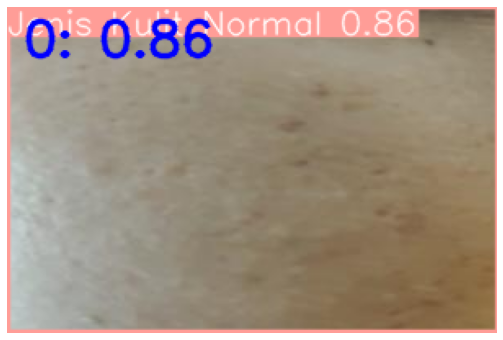


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal17_jpg.rf.2585c696563342141fc7a03e44f5810c.jpg: 224x320 1 Jenis Kulit Normal, 96.7ms
Speed: 4.3ms preprocess, 96.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


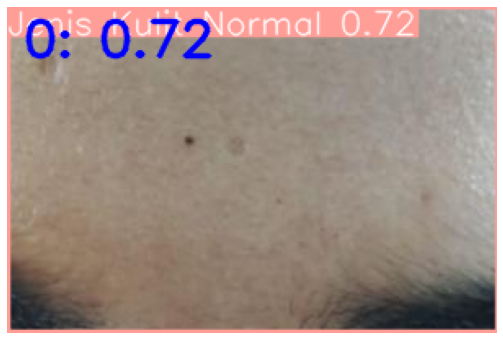


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal103_jpg.rf.129d16d81873c91bdf88c6a99d07e888.jpg: 224x320 1 Jenis Kulit Normal, 111.4ms
Speed: 1.0ms preprocess, 111.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


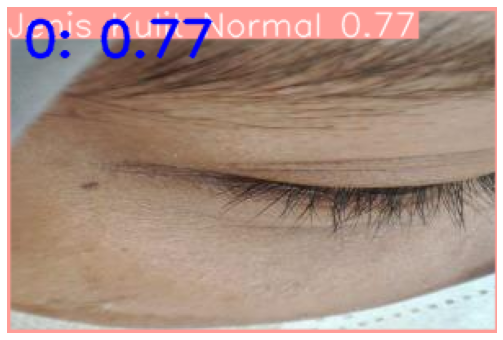


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak187_jpg.rf.58549a90adfe8fa3ea45ba2f3e13682a.jpg: 224x320 1 Jenis Kulit Berminyak, 99.5ms
Speed: 0.9ms preprocess, 99.5ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 320)


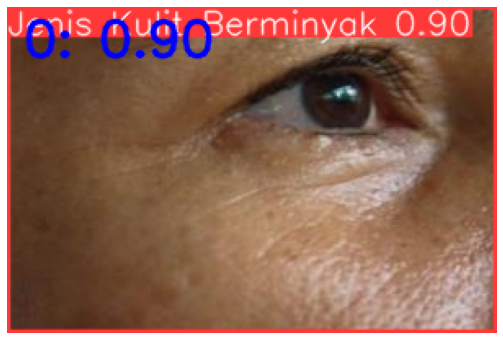


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal176_jpg.rf.e68450a211a96e6eac311a5c06096fd9.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 129.8ms
Speed: 2.1ms preprocess, 129.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


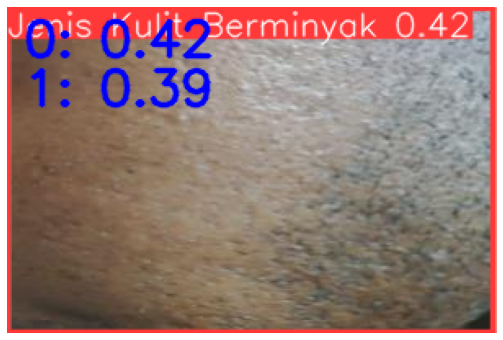


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Screenshot_2023-06-16-12-43-30-730_com-bd-nproject-edit_jpg.rf.623a8b3b2378c448f484f0a1874e3424.jpg: 224x320 1 Jenis Kulit Normal, 111.0ms
Speed: 1.1ms preprocess, 111.0ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


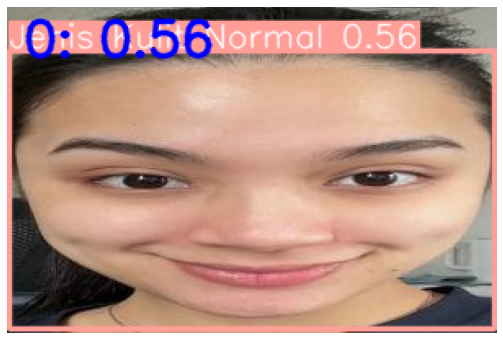


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal30_jpg.rf.23c47b7816dfe46dfc4345eab5877f96.jpg: 224x320 1 Jenis Kulit Normal, 90.6ms
Speed: 1.3ms preprocess, 90.6ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


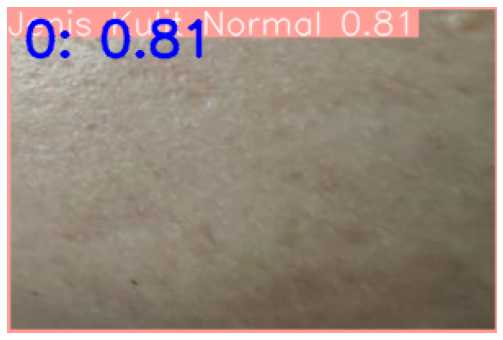


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak211_jpg.rf.96fc44e55984045bb4b277eb0706952e.jpg: 224x320 1 Jenis Kulit Berminyak, 93.7ms
Speed: 4.2ms preprocess, 93.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


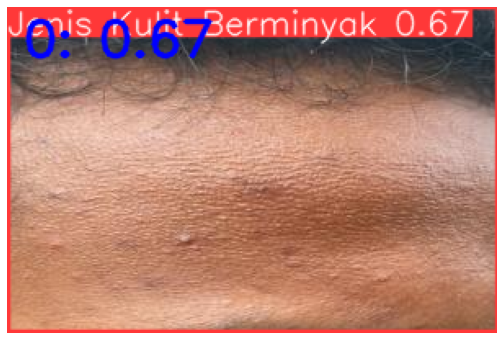


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal174_jpg.rf.08331578e6922540bf5876e0172abb94.jpg: 224x320 1 Jenis Kulit Normal, 111.1ms
Speed: 1.6ms preprocess, 111.1ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


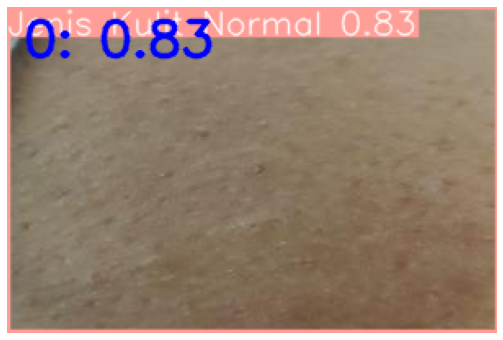


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak74_jpg.rf.2c2c7b07fad09608df95f2c320885f5d.jpg: 224x320 1 Jenis Kulit Berminyak, 98.5ms
Speed: 1.8ms preprocess, 98.5ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


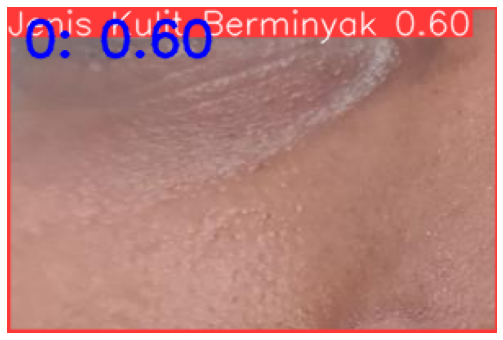


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal170_jpg.rf.297f8eef2f6e45192862937a22484de1.jpg: 224x320 1 Jenis Kulit Normal, 103.9ms
Speed: 3.1ms preprocess, 103.9ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


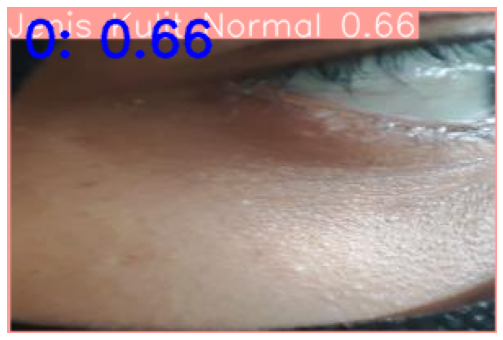


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal287_jpg.rf.fc0332f5dbbf029ecaf51465de8f8af3.jpg: 224x320 1 Jenis Kulit Normal, 81.6ms
Speed: 1.9ms preprocess, 81.6ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


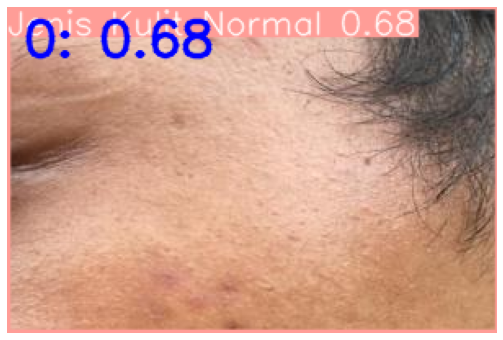


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal188_jpg.rf.acf4eab056346f2e56b6eccdd5419da2.jpg: 224x320 1 Jenis Kulit Berminyak, 89.7ms
Speed: 1.3ms preprocess, 89.7ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


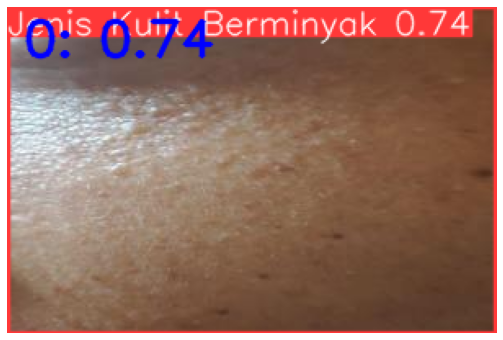

In [ ]:
# Path ke model yang telah dilatih
model_path = os.path.expanduser('runs/detect/train/weights/best.pt')  # Sesuaikan path ini dengan path model Anda setelah pelatihan selesai

# Load the trained model
model = YOLO(model_path)

# Path ke folder test
test_folder = os.path.expanduser('~/Jenis-Kulit-Wajah-6/test/images')

# Dapatkan daftar file gambar di folder test
test_images = [os.path.join(test_folder, img) for img in os.listdir(test_folder) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Fungsi untuk menampilkan gambar dengan deteksi
def show_detection(image_path, results):
    img = cv2.imread(image_path)
    annotated_frame = results[0].plot()

    # Extracting the detected classes and their confidence scores
    detected_classes = results[0].names
    confidence_scores = results[0].boxes.conf

    # Display the detected skin type and confidence
    for i, (detected_class, confidence) in enumerate(zip(detected_classes, confidence_scores)):
        label = f'{detected_class}: {confidence:.2f}'
        cv2.putText(annotated_frame, label, (10, 30 + i*30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    # Convert BGR to RGB
    annotated_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

    # Display the image
    plt.figure(figsize=(10, 6))
    plt.imshow(annotated_frame)
    plt.axis('off')
    plt.show()

# Loop through test images and display detections
for image_path in test_images:
    # Perform detection
    results = model.predict(image_path)

    # Show the detection on the image
    show_detection(image_path, results)


In [ ]:
# Path ke folder label ground truth
labels_folder = os.path.expanduser('~/Jenis-Kulit-Wajah-6/test/labels')

# Fungsi untuk membaca label dari file
def read_label(label_path):
    with open(label_path, 'r') as file:
        labels = file.readlines()
    return [line.strip().split() for line in labels]

# Fungsi untuk menghitung IOU
def compute_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    xi1 = max(x1_min, x2_min)
    yi1 = max(y1_min, y2_min)
    xi2 = min(x1_max, x2_max)
    yi2 = min(y1_max, y2_max)

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)

    union_area = box1_area + box2_area - inter_area
    iou = inter_area / union_area
    return iou

# Fungsi untuk menghitung akurasi model
def calculate_accuracy(test_images, labels_folder, model):
    correct_detections = 0
    total_detections = 0
    total_labels = 0

    for image_path in test_images:
        # Nama file label yang sesuai
        img_name = os.path.basename(image_path)
        label_path = os.path.join(labels_folder, img_name.replace('.jpg', '.txt'))

        # Baca label ground truth
        if not os.path.exists(label_path):
            continue

        ground_truths = read_label(label_path)
        total_labels += len(ground_truths)

        # Perform detection
        results = model.predict(image_path)
        predictions = results[0].boxes

        for pred_box, pred_conf, pred_class in zip(predictions.xyxy, predictions.conf, predictions.cls):
            total_detections += 1
            pred_box = pred_box.cpu().numpy()
            pred_class = int(pred_class.cpu().numpy())

            for gt in ground_truths:
                gt_class = int(gt[0])
                gt_box = [float(coord) for coord in gt[1:]]

                # Denormalize the bounding box coordinates
                img = cv2.imread(image_path)
                height, width, _ = img.shape
                gt_box = [
                    gt_box[0] * width - gt_box[2] * width / 2,
                    gt_box[1] * height - gt_box[3] * height / 2,
                    gt_box[0] * width + gt_box[2] * width / 2,
                    gt_box[1] * height + gt_box[3] * height / 2,
                ]

                iou = compute_iou(pred_box, gt_box)
                if iou > 0.5 and pred_class == gt_class:
                    correct_detections += 1
                    break

    accuracy = correct_detections / total_labels if total_labels > 0 else 0
    return accuracy

# Menghitung akurasi
accuracy = calculate_accuracy(test_images, labels_folder, model)
print(f"Akurasi model: {accuracy:.2f}")


image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Normal82_jpg.rf.73c4cff1d20cf413b1741b9c838c990e.jpg: 224x320 1 Jenis Kulit Berminyak, 1 Jenis Kulit Normal, 145.2ms
Speed: 4.5ms preprocess, 145.2ms inference, 2.2ms postprocess per image at shape (1, 3, 224, 320)

image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak23_jpg.rf.ffdcfb3da9d803f3132521d862307452.jpg: 224x320 1 Jenis Kulit Berminyak, 106.8ms
Speed: 3.8ms preprocess, 106.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak181_jpg.rf.d2266b1288e621ffebb9b405b331c832.jpg: 224x320 1 Jenis Kulit Berminyak, 108.6ms
Speed: 3.0ms preprocess, 108.6ms inference, 2.1ms postprocess per image at shape (1, 3, 224, 320)

image 1/1 /Users/ricky/Jenis-Kulit-Wajah-6/test/images/Berminyak130_jpg.rf.36b17e132aad3cdf6c9d55b39ca082fa.jpg: 224x320 1 Jenis Kulit Berminyak, 101.3ms
Speed: 3.2ms preprocess, 101.3ms inference, 1.0ms postprocess per ima

Akurasi model: 0.89


In [ ]:
# Path ke model yang telah dilatih
model_path = os.path.expanduser('runs/detect/train/weights/best.pt')  # Sesuaikan path ini dengan path model Anda setelah pelatihan selesai

# Load the trained model
model = YOLO(model_path)

# Open a connection to the camera
cap = cv2.VideoCapture(0)  # 0 is the default camera

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print("Failed to grab frame")
        break

    # Perform detection
    results = model.predict(frame)

    # Render the results on the frame
    annotated_frame = results[0].plot()

    # Extracting the detected classes and their confidence scores
    detected_classes = results[0].names
    confidence_scores = results[0].boxes.conf

    # Display the detected skin type and confidence
    for i, (detected_class, confidence) in enumerate(zip(detected_classes, confidence_scores)):
        label = f'{detected_class}: {confidence:.2f}'
        cv2.putText(annotated_frame, label, (10, 30 + i*30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    # Show the frame
    cv2.imshow('YOLOv8 Real-time Detection', annotated_frame)

    # Break the loop if the user presses 'q'
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the camera and close all OpenCV windows
cap.release()
cv2.destroyAllWindows()


0: 192x320 1 Jenis Kulit Berminyak, 208.2ms
Speed: 43.6ms preprocess, 208.2ms inference, 32.4ms postprocess per image at shape (1, 3, 192, 320)

0: 192x320 (no detections), 58.0ms
Speed: 1.6ms preprocess, 58.0ms inference, 0.4ms postprocess per image at shape (1, 3, 192, 320)

0: 192x320 (no detections), 134.2ms
Speed: 3.0ms preprocess, 134.2ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)

0: 192x320 (no detections), 63.0ms
Speed: 1.5ms preprocess, 63.0ms inference, 0.4ms postprocess per image at shape (1, 3, 192, 320)

0: 192x320 (no detections), 50.8ms
Speed: 1.6ms preprocess, 50.8ms inference, 0.3ms postprocess per image at shape (1, 3, 192, 320)

0: 192x320 (no detections), 61.8ms
Speed: 1.5ms preprocess, 61.8ms inference, 0.4ms postprocess per image at shape (1, 3, 192, 320)

0: 192x320 (no detections), 52.5ms
Speed: 1.3ms preprocess, 52.5ms inference, 0.6ms postprocess per image at shape (1, 3, 192, 320)

0: 192x320 (no detections), 54.6ms
Speed: 1.4ms prepro

Failed to grab frame
